In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OrdinalEncoder,LabelEncoder
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score,classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

In [2]:
Insurance = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")
Insurance.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [3]:
Insurance.shape

(1000, 40)

In [4]:
Insurance.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [5]:
Insurance.dtypes.to_frame('data type')

,data type
months_as_customer,int64
age,int64
policy_number,int64
policy_bind_date,object
policy_state,object
policy_csl,object
policy_deductable,int64
policy_annual_premium,float64
umbrella_limit,int64
insured_zip,int64


In [6]:
Insurance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [7]:
Insurance.nunique().to_frame('data type')

,data type
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


?      360
NO     338
YES    302
Name: property_damage, dtype: int64


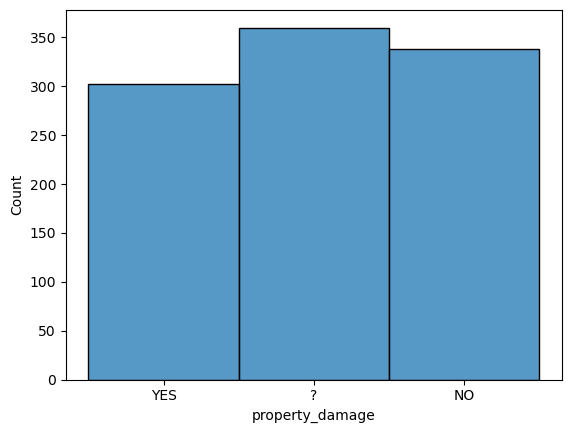

In [8]:
ax = sns.histplot(x = 'property_damage',data = Insurance)
print(Insurance['property_damage'].value_counts())

?      360
NO     338
YES    302
Name: property_damage, dtype: int64


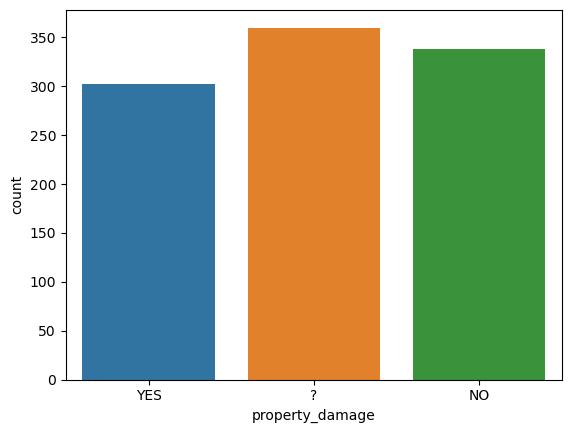

In [9]:
ax = sns.countplot(x = 'property_damage',data = Insurance)
print(Insurance['property_damage'].value_counts())

In [10]:
for i in Insurance.columns:
     Insurance[i] =Insurance[i].replace('?',pd.NA)

In [11]:
Insurance.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [12]:
Insurance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [13]:
for i in Insurance:
    if Insurance[i].dtypes == 'object':
        Insurance[i] = Insurance[i].fillna(Insurance[i].mode()[0])

In [14]:
Insurance.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [15]:
Insurance['_c39'].unique()

array([nan])

dropping column _c39 since it contains no any data

In [16]:
Insurance = Insurance.drop(columns = ['_c39'])

In [17]:
Insurance.columns.tolist()

['months_as_customer',
 'age',
 'policy_number',
 'policy_bind_date',
 'policy_state',
 'policy_csl',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'capital-gains',
 'capital-loss',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'property_damage',
 'bodily_injuries',
 'witnesses',
 'police_report_available',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_make',
 'auto_model',
 'auto_year',
 'fraud_reported']

NO     698
YES    302
Name: property_damage, dtype: int64


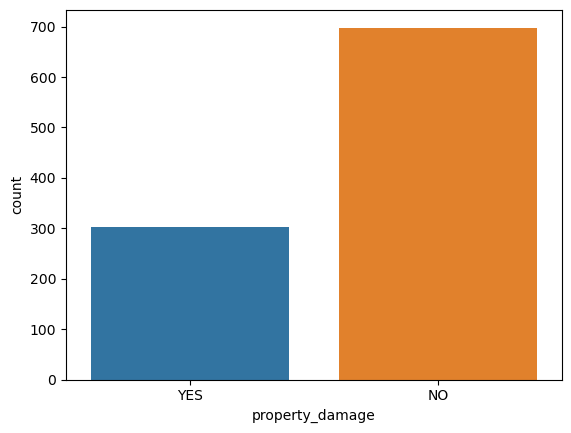

In [18]:
ax = sns.countplot(x = 'property_damage',data = Insurance)
print(Insurance['property_damage'].value_counts())

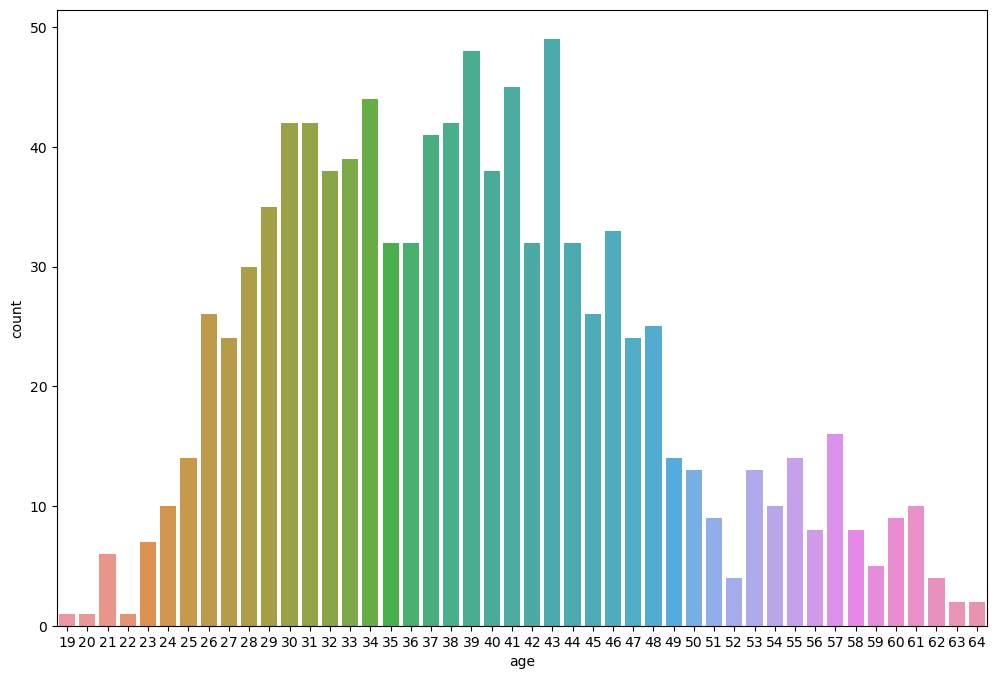

In [19]:
plt.figure(figsize = (12,8))
ax = sns.countplot(x = 'age',data = Insurance)

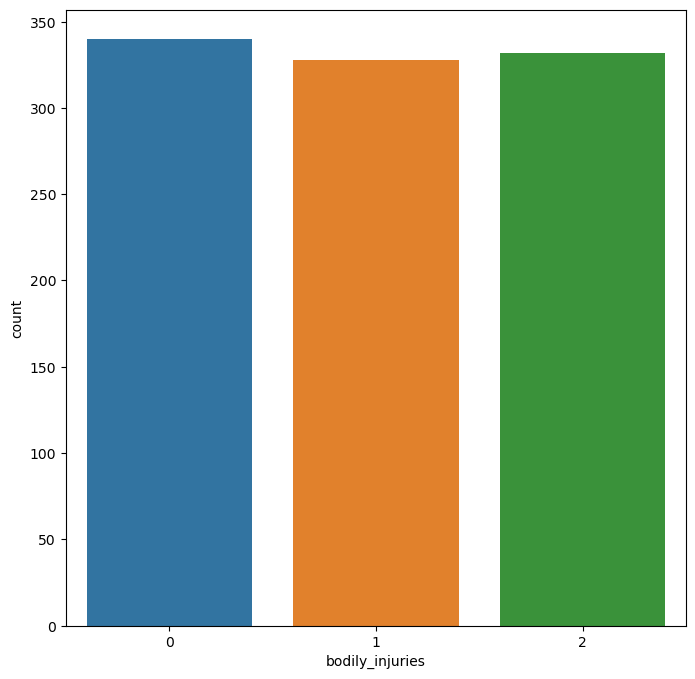

In [20]:
plt.figure(figsize=(8,8))
ax=sns.countplot(x='bodily_injuries', data = Insurance)
plt.show()

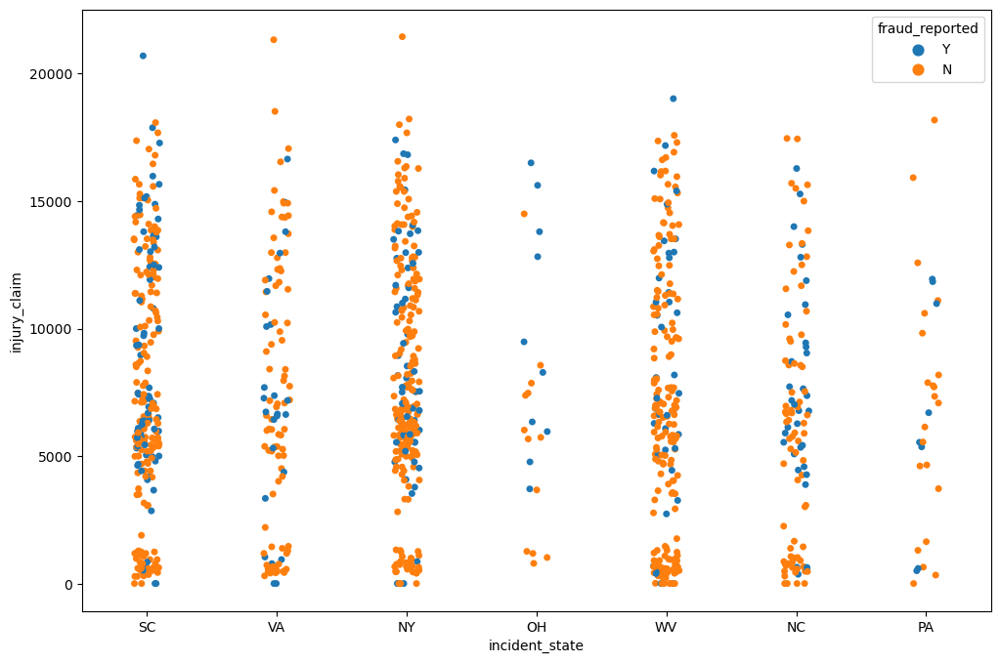

In [21]:
plt.figure(figsize = (12,8))
ax = sns.stripplot(x='incident_state', y='injury_claim', data=Insurance, hue ='fraud_reported')

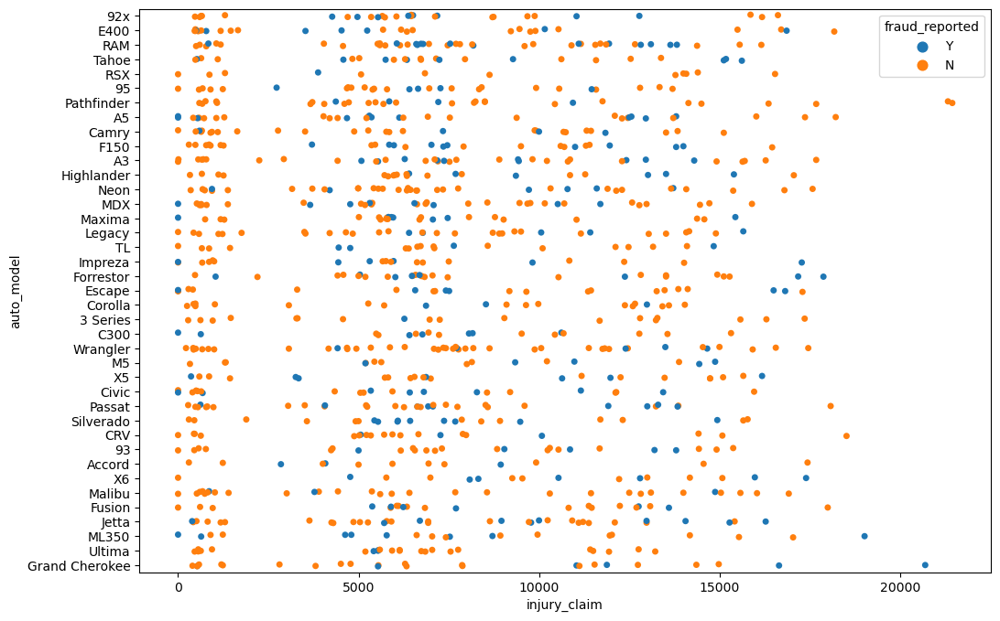

In [22]:
plt.figure(figsize = (12,8))
ax = sns.stripplot(x='injury_claim', y='auto_model', data=Insurance, hue ='fraud_reported')

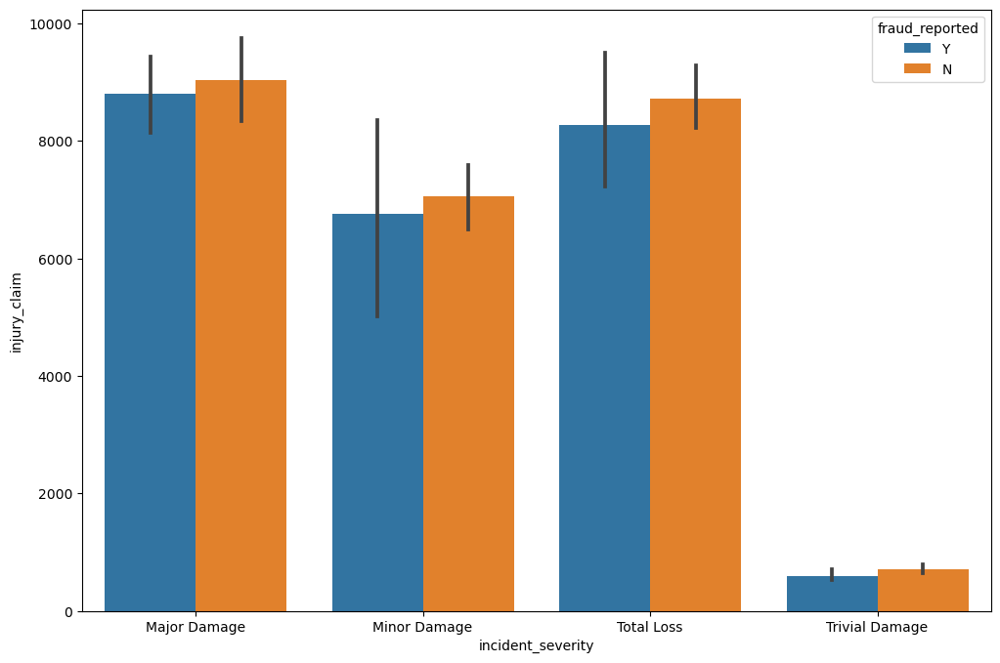

In [23]:
plt.figure(figsize = (12,8))
ax = sns.barplot(x='incident_severity', y='injury_claim', data=Insurance, hue ='fraud_reported')

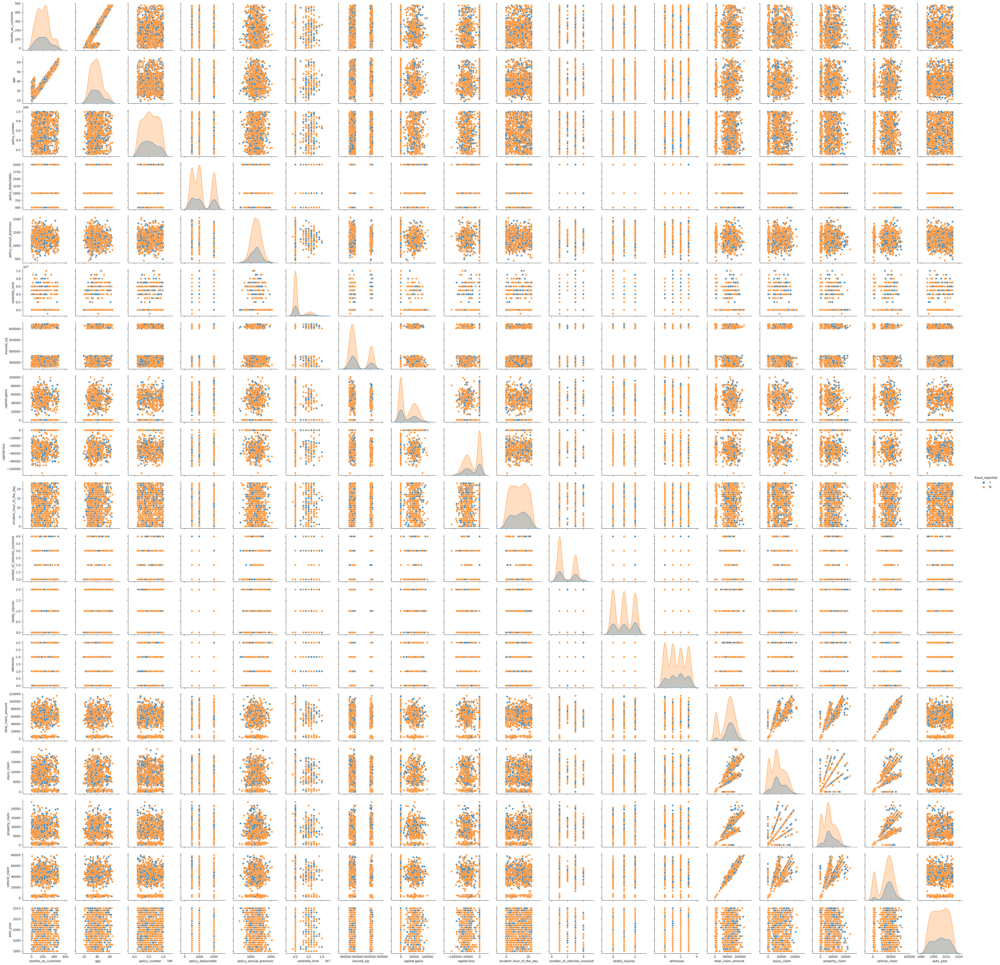

In [24]:
sns.pairplot(Insurance, hue = 'fraud_reported')
plt.show()

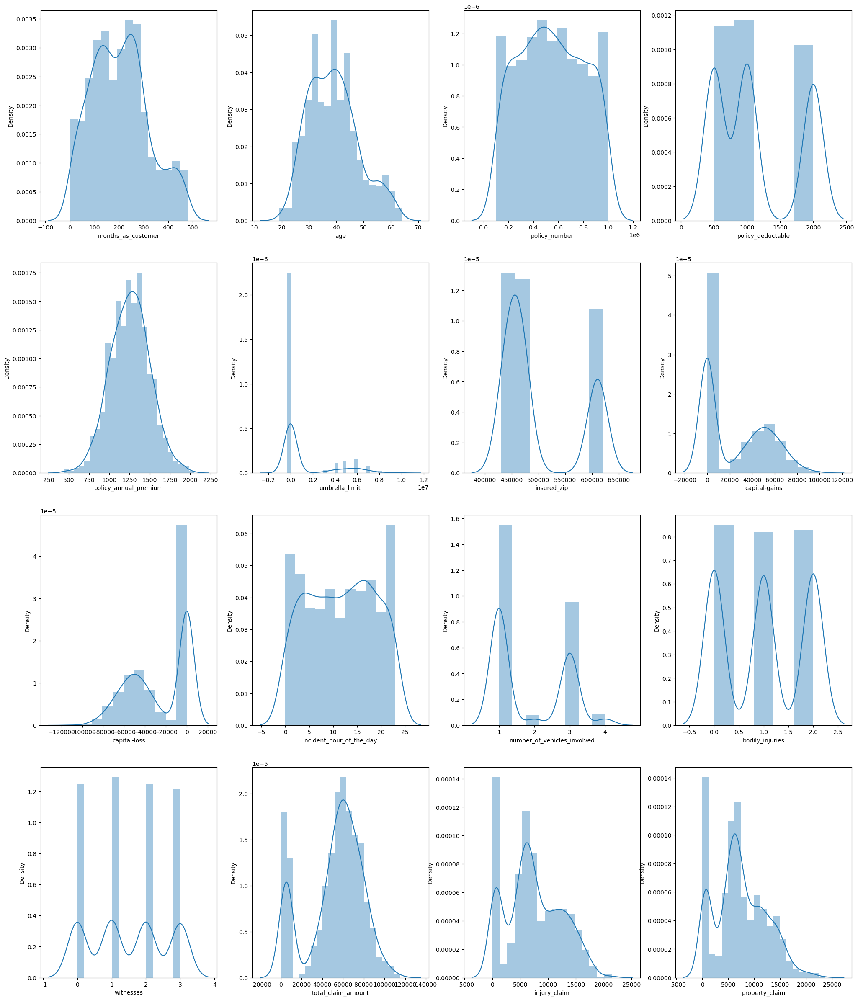

In [25]:
plt.figure(figsize=(25,30))
plotnumber = 1
for column in Insurance.columns:
    if pd.api.types.is_numeric_dtype(Insurance[column]):
        if plotnumber<=16:
            ax = plt.subplot(4,4,plotnumber)
            sns.distplot(Insurance[column])
            plt.xlabel(column,fontsize = 10)
        plotnumber+=1
plt.show()

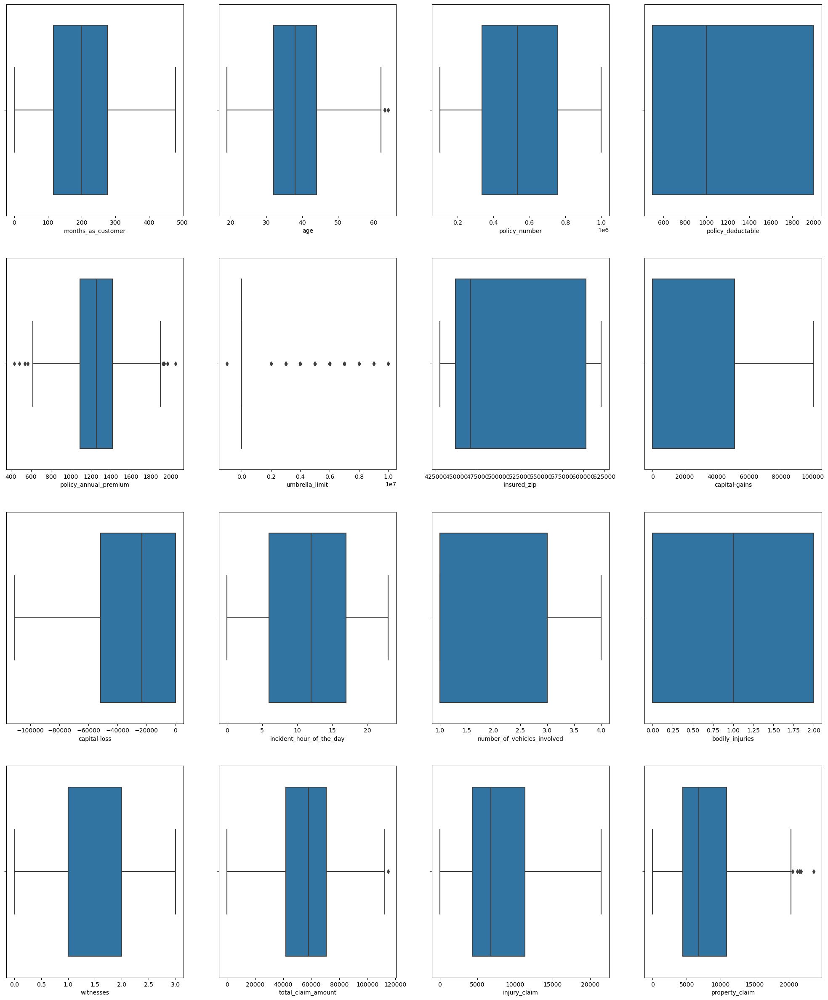

In [26]:
plt.figure(figsize=(25,30))
plotnumber = 1
for column in Insurance.columns:
    if pd.api.types.is_numeric_dtype(Insurance[column]):
        if plotnumber<=16:
            ax = plt.subplot(4,4,plotnumber)
            sns.boxplot(Insurance[column])
            plt.xlabel(column,fontsize = 10)
        plotnumber+=1
plt.show()

<AxesSubplot:>

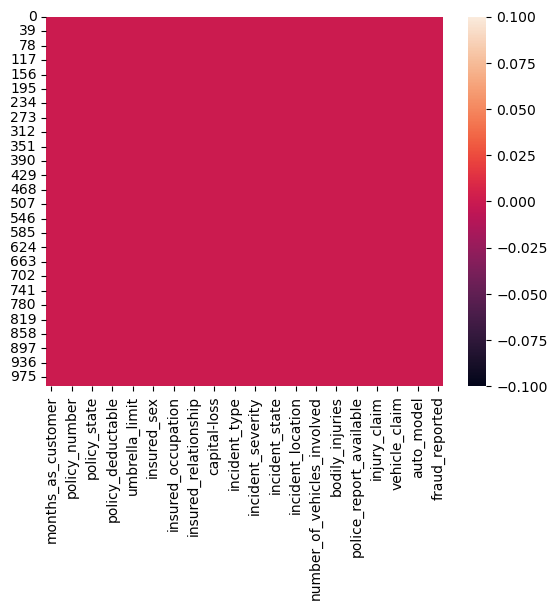

In [27]:
sns.heatmap(Insurance.isnull())

In [28]:
from scipy.stats import zscore
from scipy import stats

In [29]:
q1 = Insurance.quantile(0.25)
q3 = Insurance.quantile(0.75)
iqr = q3-q1

In [30]:
policy_annual_premium_high =(q3['policy_annual_premium'] + (1.5*iqr['policy_annual_premium']))
print(policy_annual_premium_high)
np_index = np.where(Insurance['policy_annual_premium']>policy_annual_premium_high)
print(np_index)
Insurance = Insurance.drop(Insurance.index[np_index])
Insurance.shape
Insurance.reset_index()

1904.8262500000003
(array([133, 229, 544, 747, 796], dtype=int64),)


,index,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,...,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
990,995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,...,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N
991,996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,...,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N
992,997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
993,998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [31]:
policy_annual_premium_low =(q3['policy_annual_premium'] - (1.5*iqr['policy_annual_premium']))
print(policy_annual_premium_low)
np_index = np.where(Insurance['policy_annual_premium']<policy_annual_premium_low)
print(np_index)
Insurance = Insurance.drop(Insurance.index[np_index])
Insurance.shape
Insurance.reset_index()

926.56375
(array([ 17,  21,  24,  27,  43,  59,  60,  67,  72,  84,  86, 131, 148,
       174, 177, 187, 205, 208, 215, 242, 246, 253, 265, 276, 289, 295,
       303, 309, 316, 321, 335, 347, 359, 372, 377, 384, 430, 435, 439,
       459, 461, 476, 490, 493, 498, 499, 503, 507, 521, 566, 598, 607,
       615, 623, 625, 649, 655, 656, 678, 691, 700, 704, 720, 722, 730,
       748, 755, 759, 792, 797, 826, 835, 864, 893, 896, 902, 910, 911,
       927, 939, 964, 965, 978, 987, 994], dtype=int64),)


,index,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,...,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
905,994,141,30,681486,24-03-2007,IN,500/1000,1000,1347.04,0,...,2,YES,6480,540,1080,4860,Honda,Civic,1996,N
906,995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,...,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N
907,996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,...,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N
908,997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N


In [32]:
umbrella_limit_low =(q3['umbrella_limit'] - (1.5*iqr['umbrella_limit']))
print(umbrella_limit_low)
np_index = np.where(Insurance['umbrella_limit']<umbrella_limit_low)
print(np_index)
Insurance = Insurance.drop(Insurance.index[np_index])
Insurance.shape
Insurance.reset_index()

0.0
(array([264], dtype=int64),)


,index,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,...,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
904,994,141,30,681486,24-03-2007,IN,500/1000,1000,1347.04,0,...,2,YES,6480,540,1080,4860,Honda,Civic,1996,N
905,995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,...,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N
906,996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,...,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N
907,997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N


In [33]:
umbrella_limit_high =(q3['umbrella_limit'] + (1.5*iqr['umbrella_limit']))
print(umbrella_limit_high)
np_index = np.where(Insurance['umbrella_limit']>umbrella_limit_high)
print(np_index)
Insurance = Insurance.drop(Insurance.index[np_index])
Insurance.shape
Insurance.reset_index()

0.0
(array([  1,   2,   3,   4,  10,  12,  16,  19,  27,  31,  42,  43,  45,
        57,  59,  69,  72,  73,  77,  79,  80,  84, 100, 104, 108, 109,
       110, 114, 118, 130, 133, 140, 143, 147, 159, 163, 166, 167, 168,
       169, 177, 185, 190, 193, 195, 199, 203, 206, 210, 215, 225, 228,
       238, 239, 253, 257, 260, 263, 272, 274, 276, 278, 283, 296, 301,
       302, 303, 310, 312, 313, 317, 325, 330, 337, 338, 340, 342, 349,
       350, 352, 355, 357, 360, 366, 376, 380, 388, 391, 402, 404, 408,
       416, 421, 424, 427, 430, 435, 446, 449, 454, 455, 468, 474, 478,
       488, 489, 504, 508, 513, 516, 520, 529, 543, 544, 545, 548, 552,
       562, 572, 580, 585, 593, 594, 596, 597, 600, 601, 602, 603, 612,
       613, 620, 623, 627, 632, 636, 647, 649, 651, 660, 665, 672, 674,
       680, 689, 690, 718, 721, 722, 723, 736, 737, 754, 758, 770, 771,
       790, 796, 798, 800, 808, 833, 838, 849, 851, 853, 854, 855, 857,
       860, 861, 863, 864, 865, 871, 878, 880, 881, 887, 88

,index,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
2,6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,...,0,NO,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
3,7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,...,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
4,8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,...,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
720,991,257,44,109392,12-07-2006,OH,100/300,1000,1280.88,0,...,1,NO,46980,0,5220,41760,Accura,TL,2002,N
721,993,124,28,674570,08-12-2001,OH,250/500,1000,1235.14,0,...,1,NO,60200,6020,6020,48160,Volkswagen,Passat,2012,N
722,994,141,30,681486,24-03-2007,IN,500/1000,1000,1347.04,0,...,2,YES,6480,540,1080,4860,Honda,Civic,1996,N
723,995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,...,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N


In [34]:
total_claim_amount_high =(q3['total_claim_amount'] + (1.5*iqr['total_claim_amount']))
print(total_claim_amount_high)
np_index = np.where(Insurance['total_claim_amount']>total_claim_amount_high)
print(np_index)
Insurance = Insurance.drop(Insurance.index[np_index])
Insurance.shape
Insurance.reset_index()

113762.5
(array([6], dtype=int64),)


,index,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
2,6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,...,0,NO,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
3,7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,...,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
4,8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,...,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
719,991,257,44,109392,12-07-2006,OH,100/300,1000,1280.88,0,...,1,NO,46980,0,5220,41760,Accura,TL,2002,N
720,993,124,28,674570,08-12-2001,OH,250/500,1000,1235.14,0,...,1,NO,60200,6020,6020,48160,Volkswagen,Passat,2012,N
721,994,141,30,681486,24-03-2007,IN,500/1000,1000,1347.04,0,...,2,YES,6480,540,1080,4860,Honda,Civic,1996,N
722,995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,...,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N


In [35]:
property_claim_high =(q3['property_claim'] + (1.5*iqr['property_claim']))
print(property_claim_high)
np_index = np.where(Insurance['property_claim']>property_claim_high)
print(np_index)
Insurance = Insurance.drop(Insurance.index[np_index])
Insurance.shape
Insurance.reset_index()

20545.0
(array([114, 211, 424, 490], dtype=int64),)


,index,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
2,6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,...,0,NO,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
3,7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,...,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
4,8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,...,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,991,257,44,109392,12-07-2006,OH,100/300,1000,1280.88,0,...,1,NO,46980,0,5220,41760,Accura,TL,2002,N
716,993,124,28,674570,08-12-2001,OH,250/500,1000,1235.14,0,...,1,NO,60200,6020,6020,48160,Volkswagen,Passat,2012,N
717,994,141,30,681486,24-03-2007,IN,500/1000,1000,1347.04,0,...,2,YES,6480,540,1080,4860,Honda,Civic,1996,N
718,995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,...,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N


In [36]:
age_high =(q3['age'] + (1.5*iqr['age']))
print(age_high)
np_index = np.where(Insurance['age']>age_high)
print(np_index)
Insurance = Insurance.drop(Insurance.index[np_index])
Insurance.shape
Insurance.reset_index()

62.0
(array([379, 419], dtype=int64),)


,index,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
2,6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,...,0,NO,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
3,7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,...,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
4,8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,...,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
713,991,257,44,109392,12-07-2006,OH,100/300,1000,1280.88,0,...,1,NO,46980,0,5220,41760,Accura,TL,2002,N
714,993,124,28,674570,08-12-2001,OH,250/500,1000,1235.14,0,...,1,NO,60200,6020,6020,48160,Volkswagen,Passat,2012,N
715,994,141,30,681486,24-03-2007,IN,500/1000,1000,1347.04,0,...,2,YES,6480,540,1080,4860,Honda,Civic,1996,N
716,995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,...,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N


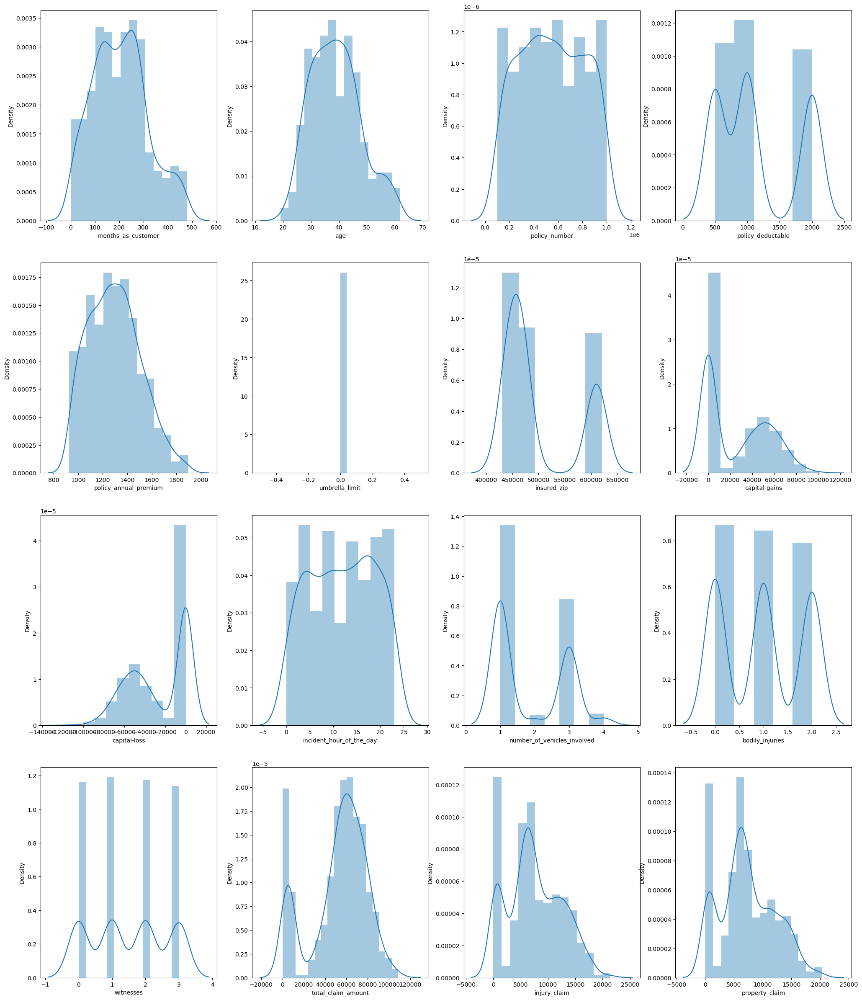

In [37]:
plt.figure(figsize=(25,30))
plotnumber = 1
for column in Insurance.columns:
    if pd.api.types.is_numeric_dtype(Insurance[column]):
        if plotnumber<=16:
            ax = plt.subplot(4,4,plotnumber)
            sns.distplot(Insurance[column])
            plt.xlabel(column,fontsize = 10)
        plotnumber+=1
plt.show()

In [38]:
label_encoder = OrdinalEncoder()
for i in Insurance.columns:
     if Insurance[i].dtypes=='object':
        Insurance[i]=label_encoder.fit_transform(Insurance[i].values.reshape(-1,1))

In [39]:
Insurance.describe()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
count,718.000000,718.000000,718.000000,718.000000,718.000000,718.000000,718.000000,718.000000,718.0,718.000000,...,718.000000,718.000000,718.000000,718.000000,718.000000,718.000000,718.000000,718.000000,718.000000,718.000000
mean,204.488858,38.926184,550285.561281,343.928969,1.008357,0.951253,1150.417827,1296.376894,0.0,500761.871866,...,1.490251,0.338440,52939.610028,7559.554318,7336.768802,38043.286908,6.625348,19.253482,2005.104457,0.228412
std,112.467577,8.962115,261484.337949,200.210466,0.826640,0.817601,608.808969,209.117147,0.0,70956.665057,...,1.112520,0.473509,26079.339399,4886.789475,4719.074724,18688.320827,4.074998,11.222354,5.980345,0.420102
min,0.000000,19.000000,101421.000000,0.000000,0.000000,0.000000,500.000000,927.230000,0.0,430104.000000,...,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,0.000000,0.000000,1995.000000,0.000000
25%,121.250000,32.000000,331298.250000,170.250000,0.000000,0.000000,500.000000,1126.227500,0.0,448957.750000,...,1.000000,0.000000,42685.000000,4435.000000,4435.000000,30940.000000,3.000000,9.000000,2000.000000,0.000000
50%,201.500000,38.000000,544865.500000,341.500000,1.000000,1.000000,1000.000000,1281.260000,0.0,466583.500000,...,1.000000,0.000000,58300.000000,6880.000000,6690.000000,42450.000000,7.000000,20.000000,2005.000000,0.000000
75%,276.000000,45.000000,777387.250000,516.750000,2.000000,2.000000,2000.000000,1437.480000,0.0,602631.000000,...,2.000000,1.000000,70865.000000,11380.000000,10855.000000,50892.500000,10.000000,29.000000,2010.000000,0.000000
max,479.000000,62.000000,999435.000000,690.000000,2.000000,2.000000,2000.000000,1896.910000,0.0,620962.000000,...,3.000000,1.000000,108480.000000,21450.000000,20310.000000,77670.000000,13.000000,38.000000,2015.000000,1.000000


In [40]:
Features = Insurance.drop(columns = ['fraud_reported'])
Label = Insurance['fraud_reported']

In [41]:
scaler = StandardScaler()
Features = pd.DataFrame(scaler.fit_transform(Features),columns = Features.columns)
Features

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,1.098959,1.013169,-0.109837,0.200284,1.200444,0.059663,-0.247241,0.528939,0.0,-0.488383,...,0.037659,0.458513,1.398117,0.716406,-0.214924,1.205150,0.751619,0.828713,-1.627663,-0.184810
1,0.458328,0.008242,-1.705656,-0.354519,1.200444,0.059663,-0.247241,0.261869,0.0,-0.314578,...,-1.191383,0.458513,-0.715247,0.428238,-0.235401,-0.196525,0.708782,0.828713,-1.449323,-0.352141
2,-0.600492,-0.550051,-0.521647,-1.314178,-0.010116,0.059663,-0.247241,0.176929,0.0,-0.832720,...,-1.191383,-1.340461,-0.715247,0.986540,2.844430,-0.039605,0.642919,0.583143,0.869097,1.153838
3,-0.351358,-0.215075,-0.464055,-1.499113,-1.220676,-1.164280,-0.247241,-0.762529,0.0,1.444608,...,1.266700,0.458513,1.398117,-0.051786,0.372784,0.433275,-0.279154,-1.381417,-1.270983,1.655831
4,-1.579234,-0.661709,-0.247302,-1.239205,-1.220676,-1.164280,-1.069089,0.701594,0.0,1.424003,...,0.037659,-0.440974,1.398117,-0.968476,-0.980786,-0.968400,-0.850497,1.319853,-0.914303,1.153838
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
713,0.467226,0.566535,-1.687294,-0.394505,1.200444,-1.164280,-0.247241,-0.074158,0.0,-0.941806,...,-1.191383,-0.440974,-0.715247,-0.228678,-1.548015,-0.448869,0.199018,-1.626987,1.225777,-0.519472
714,-0.716162,-1.220002,0.475635,-0.799361,1.200444,0.059663,-0.247241,-0.293039,0.0,-0.806615,...,-1.191383,-0.440974,-0.715247,0.278590,-0.315264,-0.279226,0.541716,1.565423,0.779927,1.153838
715,-0.564902,-0.996685,0.502102,0.935023,-0.010116,1.283606,-0.247241,0.242440,0.0,-0.988572,...,0.037659,0.458513,1.398117,-1.782714,-1.437436,-1.326771,-1.776854,-0.153567,-0.825133,-1.523458
716,-1.792777,-0.103416,1.498516,0.035343,1.200444,1.283606,-0.247241,0.069019,0.0,-0.979771,...,-1.191383,-0.440974,-0.715247,1.314614,2.023278,0.293319,1.231397,-0.153567,-1.181813,0.149852


In [42]:
vif = pd.DataFrame()
vif['vif values']= [variance_inflation_factor(Features.values, i) for i in range(len(Features.columns))]
vif['features'] = Features.columns

In [43]:
vif

,vif values,features
0,6.920201,months_as_customer
1,6.963314,age
2,1.041017,policy_number
3,1.040412,policy_bind_date
4,1.065988,policy_state
5,1.034664,policy_csl
6,1.065712,policy_deductable
7,1.086036,policy_annual_premium
8,NaN,umbrella_limit
9,1.040847,insured_zip


In [44]:
columns_to_drop = ['vehicle_claim','injury_claim','total_claim_amount','property_claim','umbrella_limit']

In [45]:
Features1 = Features.drop(columns = columns_to_drop )

In [46]:
Features1.columns.to_frame('new columns')

,0
months_as_customer,months_as_customer
age,age
policy_number,policy_number
policy_bind_date,policy_bind_date
policy_state,policy_state
policy_csl,policy_csl
policy_deductable,policy_deductable
policy_annual_premium,policy_annual_premium
insured_zip,insured_zip
insured_sex,insured_sex


In [47]:
vif = pd.DataFrame()
vif['vif values']= [variance_inflation_factor(Features1.values, i) for i in range(len(Features1.columns))]
vif['features'] = Features1.columns
vif

,vif values,features
0,6.843430,months_as_customer
1,6.873946,age
2,1.037686,policy_number
3,1.039417,policy_bind_date
4,1.057736,policy_state
5,1.031423,policy_csl
6,1.049584,policy_deductable
7,1.074137,policy_annual_premium
8,1.039015,insured_zip
9,1.033274,insured_sex


In [48]:
Label.value_counts()

0.0    554
1.0    164
Name: fraud_reported, dtype: int64

In [49]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
Features2,Label1 = SM.fit_resample(Features1,Label)

In [50]:
Label1.value_counts()

1.0    554
0.0    554
Name: fraud_reported, dtype: int64

In [51]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold,cross_val_score
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,BaggingClassifier
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor
from sklearn.metrics import accuracy_score

In [52]:
MaxAccu = 0
MaxRS = 0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(Features2,Label1,test_size = .30, random_state = i)
    gbc = GradientBoostingClassifier()
    gbc.fit(x_train,y_train)
    pred = gbc.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>MaxAccu:
        MaxAccu = acc
        MaxRS = i
print('maximum r2 score is =',MaxAccu,'\n random state = ',MaxRS)

maximum r2 score is = 0.933933933933934 
 random state =  74


In [53]:
x_train,x_test,y_train,y_test = train_test_split(Features2,Label1, test_size = 0.30, random_state = MaxRS)

In [54]:
rfc = RandomForestClassifier()
rfc.fit(x_train,y_train)
pred_rfc = rfc.predict(x_test)
pred_train = rfc.predict(x_train)
print ('accuracy score:', accuracy_score(y_test,pred_rfc))
print ('confusion matrix:', confusion_matrix(y_test,pred_rfc))
print ('classification report:', classification_report(y_test,pred_rfc))

accuracy score: 0.9129129129129129
confusion matrix: [[148  12]
 [ 17 156]]
classification report:               precision    recall  f1-score   support

         0.0       0.90      0.93      0.91       160
         1.0       0.93      0.90      0.91       173

    accuracy                           0.91       333
   macro avg       0.91      0.91      0.91       333
weighted avg       0.91      0.91      0.91       333



In [55]:
gbc = GradientBoostingClassifier()
gbc.fit(x_train,y_train)
pred_gbc = gbc.predict(x_test)
pred_train = gbc.predict(x_train)
print ('accuracy score:', accuracy_score(y_test,pred_gbc))
print ('confusion matrix:', confusion_matrix(y_test,pred_gbc))
print ('classification report:', classification_report(y_test,pred_gbc))

accuracy score: 0.933933933933934
confusion matrix: [[150  10]
 [ 12 161]]
classification report:               precision    recall  f1-score   support

         0.0       0.93      0.94      0.93       160
         1.0       0.94      0.93      0.94       173

    accuracy                           0.93       333
   macro avg       0.93      0.93      0.93       333
weighted avg       0.93      0.93      0.93       333



In [56]:
bc = BaggingClassifier()
bc.fit(x_train,y_train)
pred_bc = bc.predict(x_test)
pred_train = bc.predict(x_train)
print ('accuracy score:', accuracy_score(y_test,pred_bc))
print ('confusion matrix:', confusion_matrix(y_test,pred_bc))
print ('classification report:', classification_report(y_test,pred_bc))

accuracy score: 0.8978978978978979
confusion matrix: [[147  13]
 [ 21 152]]
classification report:               precision    recall  f1-score   support

         0.0       0.88      0.92      0.90       160
         1.0       0.92      0.88      0.90       173

    accuracy                           0.90       333
   macro avg       0.90      0.90      0.90       333
weighted avg       0.90      0.90      0.90       333



In [57]:
dtr = DecisionTreeRegressor()
dtr.fit(x_train,y_train)
pred_dtr = dtr.predict(x_test)
pred_train = dtr.predict(x_train)
print ('accuracy score:', accuracy_score(y_test,pred_dtr))
print ('confusion matrix:', confusion_matrix(y_test,pred_dtr))
print ('classification report:', classification_report(y_test,pred_dtr))

accuracy score: 0.8258258258258259
confusion matrix: [[140  20]
 [ 38 135]]
classification report:               precision    recall  f1-score   support

         0.0       0.79      0.88      0.83       160
         1.0       0.87      0.78      0.82       173

    accuracy                           0.83       333
   macro avg       0.83      0.83      0.83       333
weighted avg       0.83      0.83      0.83       333



In [58]:
cross_val_score(gbc,Features2,Label1,cv=5)
cross_val_score(gbc,Features2,Label1,cv=5).mean()

0.8638375932493579

In [59]:
cross_val_score(rfc,Features2,Label1,cv=5)
cross_val_score(rfc,Features2,Label1,cv=5).mean()

0.8917981329746036

In [60]:
cross_val_score(bc,Features2,Label1,cv=5)
cross_val_score(bc,Features2,Label1,cv=5).mean()

0.8629163099751335

i can choose bc or gbc sinc e the 2 has lowest cross validation mean score

In [61]:
from sklearn.model_selection import GridSearchCV
params_grid = {'warm_start':[True,False],
             'max_samples':[1,2,5,8],
             'bootstrap_features':[False],
              'bootstrap':[True,False],
             }
grid_search =GridSearchCV(estimator=bc, param_grid = params_grid, cv = 5)


In [62]:
grid_search.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=BaggingClassifier(),
             param_grid={'bootstrap': [True, False],
                         'bootstrap_features': [False],
                         'max_samples': [1, 2, 5, 8],
                         'warm_start': [True, False]})

In [63]:
my_best_parameter = grid_search.best_params_
print(my_best_parameter)

{'bootstrap': False, 'bootstrap_features': False, 'max_samples': 8, 'warm_start': True}


In [64]:
final_model = BaggingClassifier(bootstrap= True, bootstrap_features= False, max_samples=8,warm_start=True)

In [65]:
final_model

BaggingClassifier(max_samples=8, warm_start=True)

In [66]:
final_model.fit(x_train,y_train)
pred_bc = bc.predict(x_test)
pred_train = bc.predict(x_train)
print ('accuracy score:', accuracy_score(y_test,pred_bc))
print ('confusion matrix:', confusion_matrix(y_test,pred_bc))
print ('classification report:', classification_report(y_test,pred_bc))

accuracy score: 0.8978978978978979
confusion matrix: [[147  13]
 [ 21 152]]
classification report:               precision    recall  f1-score   support

         0.0       0.88      0.92      0.90       160
         1.0       0.92      0.88      0.90       173

    accuracy                           0.90       333
   macro avg       0.90      0.90      0.90       333
weighted avg       0.90      0.90      0.90       333



In [67]:
from sklearn import metrics

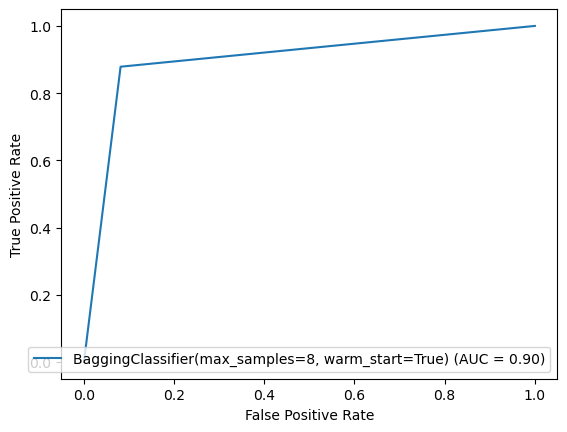

In [68]:
fpr, tpr, thresholds = metrics.roc_curve(y_test,pred_bc)
roc_auc = metrics.auc(fpr,tpr)
display = metrics.RocCurveDisplay(fpr = fpr, tpr = tpr, roc_auc = roc_auc, estimator_name = final_model)
display.plot()

In [69]:
import joblib
import pickle
filename = 'Insurance.pkl'
pickle.dump(final_model,open(filename,'wb'))

In [70]:
import pickle
loaded_final_model=pickle.load(open(filename,'rb'))
result = loaded_final_model.score(x_test,y_test)
print(result*100)

66.66666666666666
